In [16]:
import kagglehub
import os

if not os.path.exists("cartoonset100k_jpg"):
  # Download latest version
  path = kagglehub.dataset_download("brendanartley/cartoon-faces-googles-cartoon-set")

  print("Path to dataset files:", path)

  import shutil
  import os

  shutil.move(os.path.join(path,"cartoonset100k_jpg"),"./cartoonset100k_jpg")

In [17]:
directories=os.listdir("cartoonset100k_jpg")
directories

['7', '0', '2', 'cartoonset100k_jpg', '3', '8', '6', '9', '1', '5', '4']

In [18]:
images_paths=[]

for i in directories:
  temp_images=[]
  for j in os.listdir("cartoonset100k_jpg/"+i):
    temp_images.append("cartoonset100k_jpg/"+i+"/"+j)
  images_paths.extend(temp_images)


images_paths


['cartoonset100k_jpg/7/cs6081506355080856947.jpg',
 'cartoonset100k_jpg/7/cs6131138994665338020.jpg',
 'cartoonset100k_jpg/7/cs6118965523871034019.jpg',
 'cartoonset100k_jpg/7/cs6430459362372921872.jpg',
 'cartoonset100k_jpg/7/cs6133047120052408858.jpg',
 'cartoonset100k_jpg/7/cs6558524049936987377.jpg',
 'cartoonset100k_jpg/7/cs5805996460329076285.jpg',
 'cartoonset100k_jpg/7/cs6551085593211300670.jpg',
 'cartoonset100k_jpg/7/cs6167192051771909588.jpg',
 'cartoonset100k_jpg/7/cs6771988302149320658.jpg',
 'cartoonset100k_jpg/7/cs6692940953858373577.jpg',
 'cartoonset100k_jpg/7/cs5810563894172347787.jpg',
 'cartoonset100k_jpg/7/cs6279086026068693705.jpg',
 'cartoonset100k_jpg/7/cs6905184073022622147.jpg',
 'cartoonset100k_jpg/7/cs6907528399024373944.jpg',
 'cartoonset100k_jpg/7/cs5892573974785022377.jpg',
 'cartoonset100k_jpg/7/cs6894196436214992919.jpg',
 'cartoonset100k_jpg/7/cs5553786970850977151.jpg',
 'cartoonset100k_jpg/7/cs6819339433399463991.jpg',
 'cartoonset100k_jpg/7/cs587978

In [19]:
len(images_paths)

100001

In [20]:
images_paths[0]

'cartoonset100k_jpg/7/cs6081506355080856947.jpg'

In [21]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)
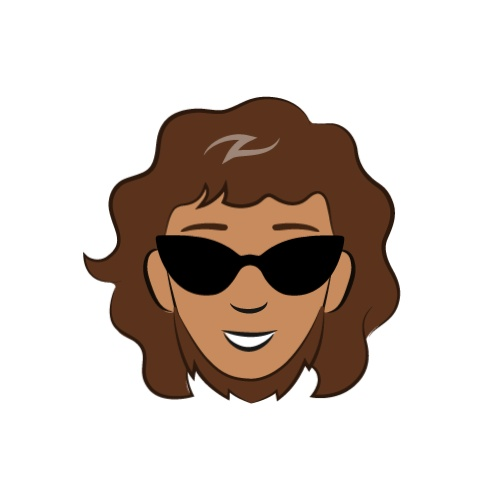

In [22]:
np.array(Image.open(images_paths[0])
)


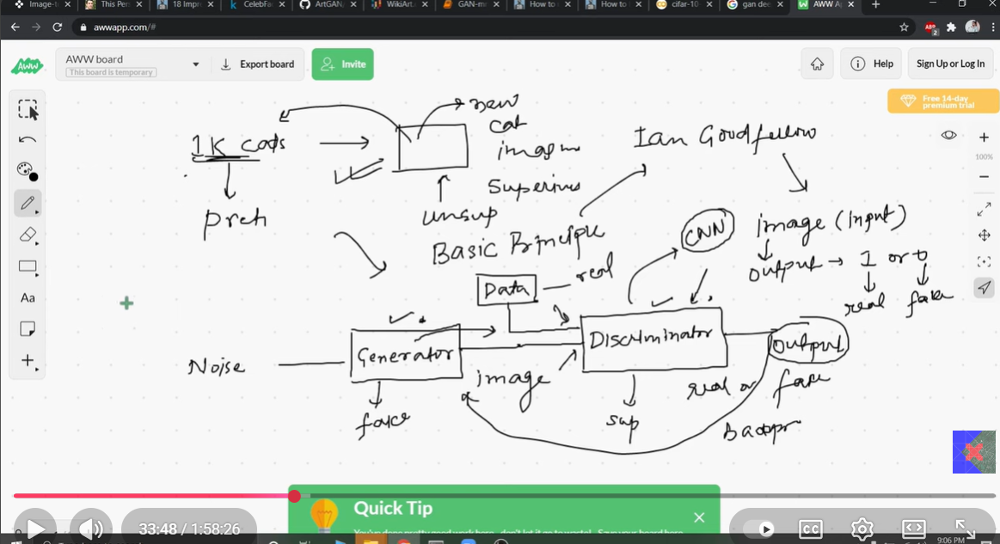

In [23]:
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from PIL import Image
from torch.utils.data import Dataset, DataLoader

In [24]:
class DatasetMaker(Dataset):
    def __init__(self,images_paths,transform=None):
        self.images_paths=images_paths
        self.transform=transform

    def __len__(self):
      return len(self.images_paths)

    def __getitem__(self, index):
      image_path=self.images_paths[index]
      image=Image.open(image_path).convert("RGB")


      if self.transform:
        image=self.transform(image)
      return image





In [25]:
transform=transforms.Compose([
    transforms.Resize((300,300)),
    transforms.CenterCrop((300,300)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5,0.5,0.5),std=(0.5,0.5,0.5)) # teeno channels ke liye mean and std values willl be in between -1 1
])

dataset=DatasetMaker(images_paths,transform=transform)
dataloader=DataLoader(dataset,batch_size=16,shuffle=True) # Reduced batch_size to 16

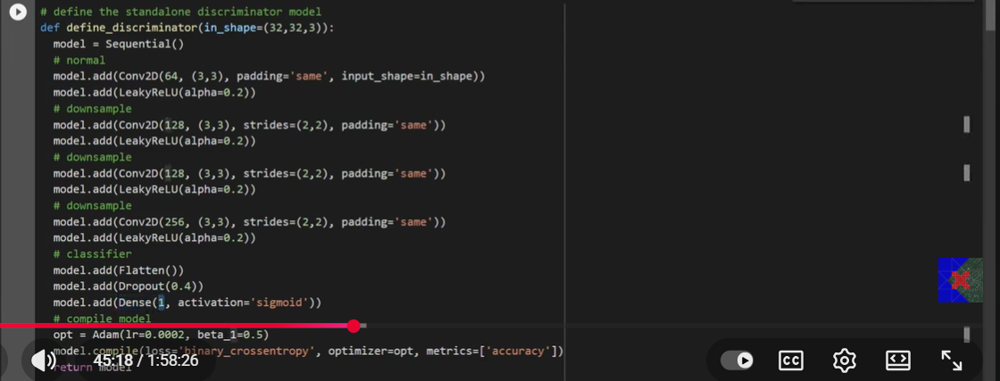

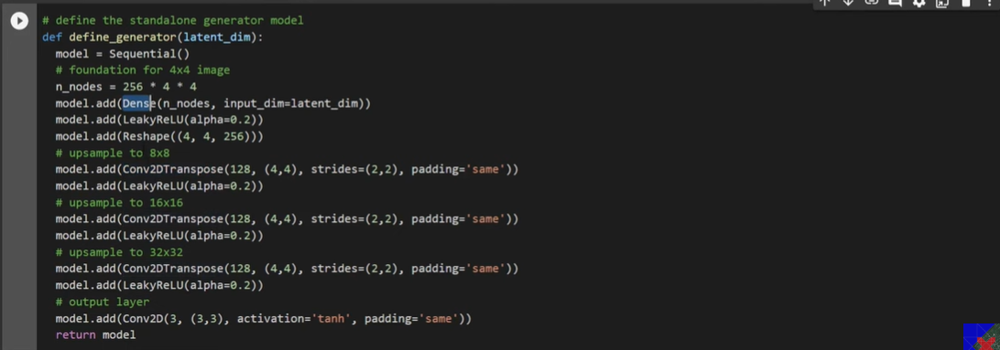

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)
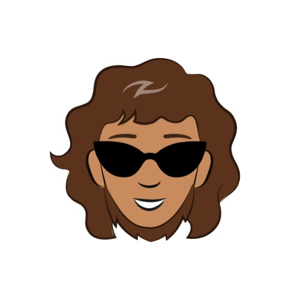

In [26]:
np.array(Image.open(images_paths[0]).resize((300,300))
)

In [27]:
class Generator(nn.Module):
  def __init__(self,z_dim=100,img_channels=3):
    super(Generator,self).__init__()
    self.netwokr = nn.Sequential(
        nn.Linear(z_dim,256),
        nn.ReLU(True),
        nn.Linear(256,512),
        nn.ReLU(True),
        nn.Linear(512,1024),
        nn.ReLU(True),
        nn.Linear(1024,img_channels*300*300),
        nn.Tanh()
    )

  def forward(self,z):
    img=self.netwokr(z)
    img=img.view(img.size(0),3,300,300)
    return img

In [28]:
class Discriminator(nn.Module):
  def __init__(self,img_channels=3):
    super(Discriminator,self).__init__()
    self.network=nn.Sequential(
        nn.Flatten(),
        nn.Linear(img_channels*300*300,1024),
        nn.LeakyReLU(0.2,True),
        nn.Linear(1024,512),
        nn.LeakyReLU(0.2,True),
        nn.Linear(512,256),
        nn.LeakyReLU(0.2,True),
        nn.Linear(256,1),
        nn.Sigmoid()
    )
  def forward(self,img):
    return self.network(img)


In [29]:
import torch.optim as optim

In [30]:
adversarial_loss=nn.BCELoss()

generator=Generator(z_dim=100,img_channels=3)
discriminator=Discriminator(img_channels=3)

optimizer_G=optim.Adam(generator.parameters(),lr=0.0002,betas=(0.5,0.999))
optimizer_D=optim.Adam(discriminator.parameters(),lr=0.0002,betas=(0.5,0.999))


device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
generator=generator.to(device)
discriminator=discriminator.to(device)


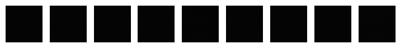

In [31]:
import matplotlib.pyplot as plt
import warnings
import logging
warnings.filterwarnings("ignore", category=UserWarning, module="matplotlib.image")
logging.getLogger('matplotlib.image').setLevel(logging.ERROR)

def draw_images(n_images=9):
  with torch.no_grad():
    images=generator(torch.randn(n_images,100).to(device))
    images=torch.clamp(images,0,1)
    images=images.detach().cpu()
  plt.figure(figsize=(10,10))
  for i in range(n_images):
    plt.subplot(10,10,i+1)
    plt.imshow(images[i].numpy().transpose(1,2,0))
    plt.axis('off')
  plt.show()
draw_images(9)

In [32]:
from IPython.core.interactiveshell import dis
def train(generator, discriminator, dataloader, epochs=5, patience=5, min_delta=0.001):
    best_g_loss = float('inf')
    epochs_no_improve = 0

    for epoch in range(epochs):
        gen_loss = float('inf')
        disc_loss = 0

        for i, imgs in enumerate(dataloader):
            real_imgs = imgs.to(device)
            batch_size = real_imgs.size(0)
            valid = torch.ones(batch_size, 1).to(device)
            fake = torch.zeros(batch_size, 1).to(device)

            # Discriminator training
            optimizer_D.zero_grad()
            real_loss = adversarial_loss(discriminator(real_imgs), valid)
            fake_loss = adversarial_loss(discriminator(generator(torch.randn(batch_size, 100).to(device)).detach()), fake)
            d_loss = (real_loss + fake_loss) / 2
            d_loss.backward()
            optimizer_D.step()

            # Generator training
            optimizer_G.zero_grad()
            g_loss = adversarial_loss(discriminator(generator(torch.randn(batch_size, 100).to(device))), valid)
            g_loss.backward()
            optimizer_G.step()

            draw_images(9)

            if g_loss.item() < gen_loss:
                torch.save(generator.state_dict(), 'generator.pth')
            gen_loss = min(g_loss.item(), gen_loss)

            if i % 50 == 0:
                print(f"[Epoch {epoch}/{epochs}][Batch {i}/{len(dataloader)}][D loss: {d_loss.item():.4f}] [G loss: {gen_loss:.4f}]")

        # Early stopping check (epoch-level generator loss)
        if gen_loss < best_g_loss - min_delta:
            best_g_loss = gen_loss
            epochs_no_improve = 0
            print(f"New best G loss: {best_g_loss:.4f}")
        else:
            epochs_no_improve += 1
            print(f"No improvement for {epochs_no_improve}/{patience} epochs")

            if epochs_no_improve >= patience:
                print(f"Early stopping at epoch {epoch+1}")
                break


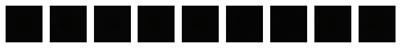

[Epoch 0/5][Batch 0/6251][D loss: 0.6787] [G loss: 0.7591]


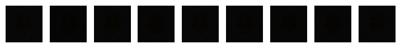

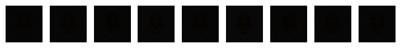

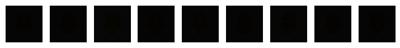

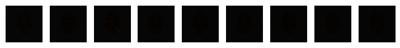

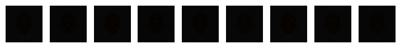

...

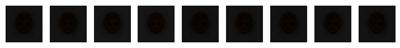

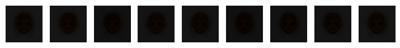

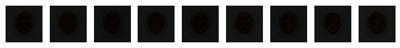

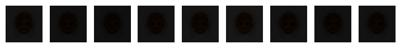

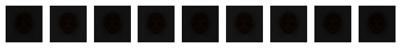

[Epoch 0/5][Batch 50/6251][D loss: 3.3422] [G loss: 0.0017]


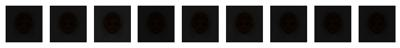

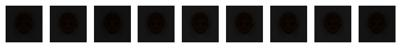

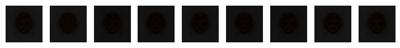

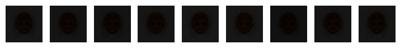

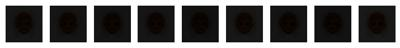

...

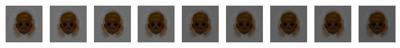

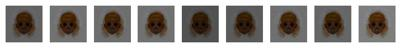

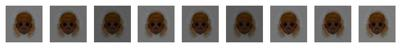

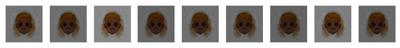

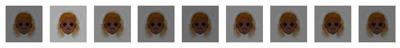

[Epoch 0/5][Batch 100/6251][D loss: 0.6902] [G loss: 0.0017]


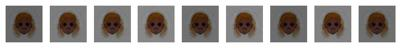

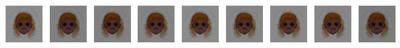

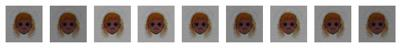

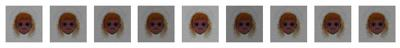

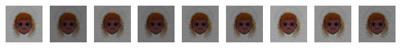

...

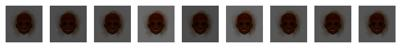

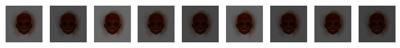

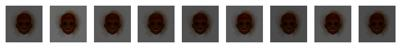

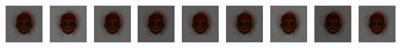

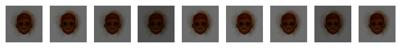

[Epoch 0/5][Batch 150/6251][D loss: 0.5900] [G loss: 0.0017]


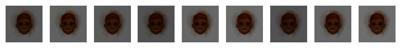

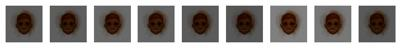

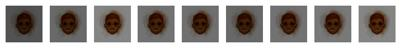

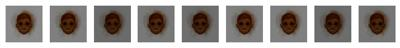

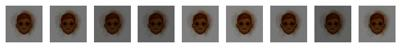

...

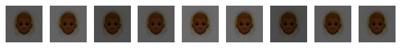

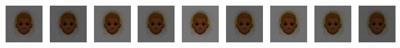

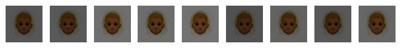

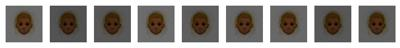

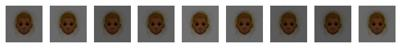

[Epoch 0/5][Batch 200/6251][D loss: 0.4665] [G loss: 0.0017]


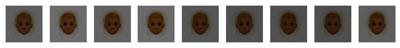

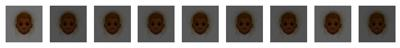

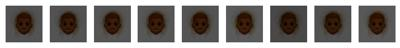

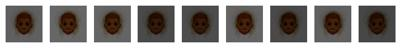

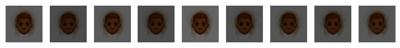

...

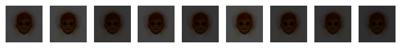

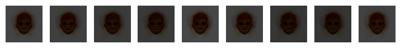

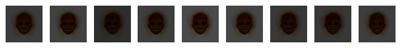

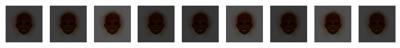

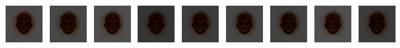

[Epoch 0/5][Batch 250/6251][D loss: 0.4888] [G loss: 0.0017]


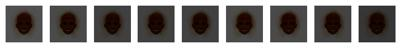

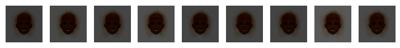

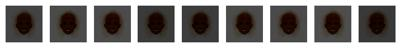

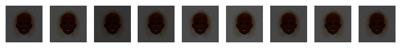

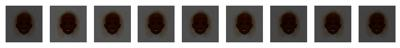

...

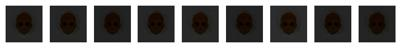

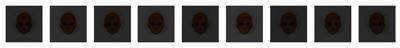

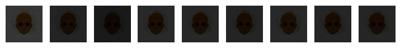

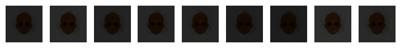

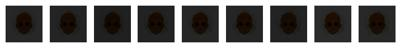

[Epoch 0/5][Batch 300/6251][D loss: 0.3487] [G loss: 0.0017]


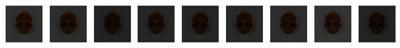

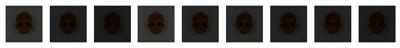

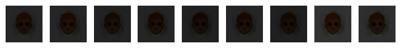

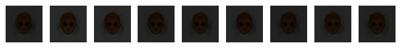

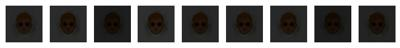

...

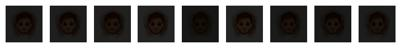

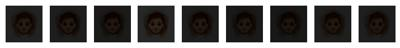

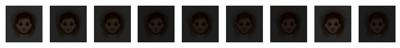

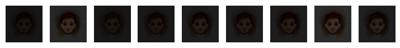

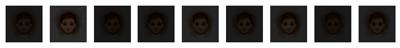

[Epoch 0/5][Batch 350/6251][D loss: 0.2786] [G loss: 0.0017]


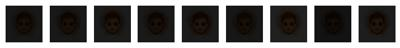

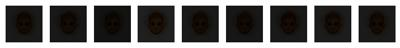

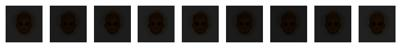

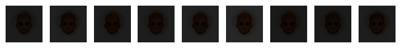

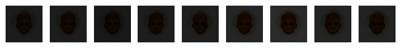

...

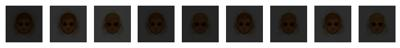

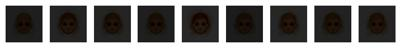

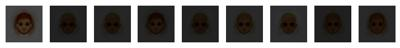

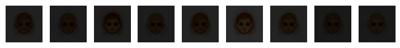

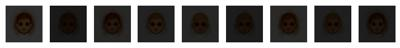

[Epoch 0/5][Batch 400/6251][D loss: 0.4358] [G loss: 0.0017]


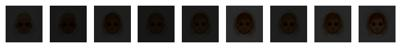

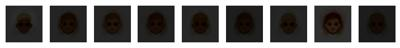

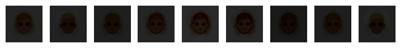

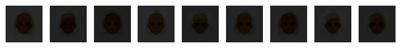

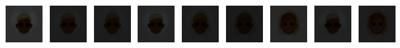

...

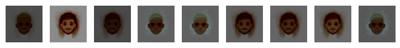

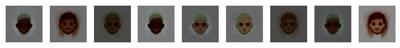

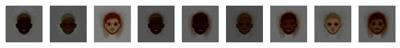

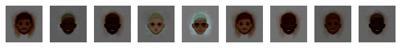

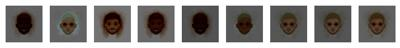

[Epoch 0/5][Batch 450/6251][D loss: 0.5601] [G loss: 0.0017]


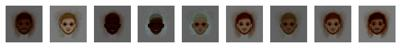

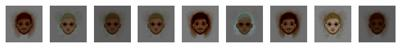

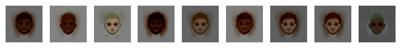

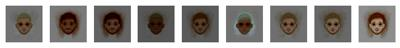

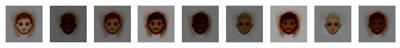

...

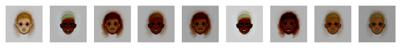

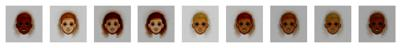

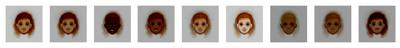

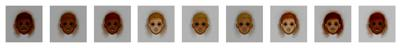

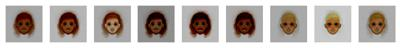

[Epoch 0/5][Batch 500/6251][D loss: 0.6346] [G loss: 0.0017]


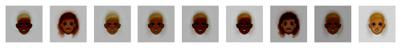

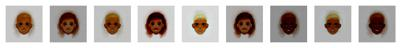

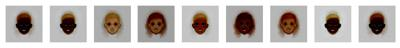

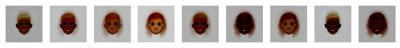

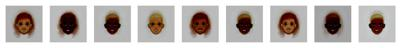

...

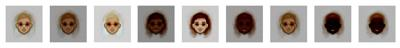

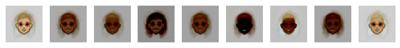

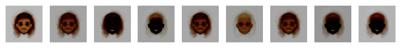

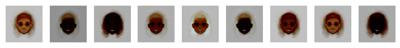

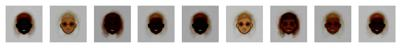

[Epoch 0/5][Batch 550/6251][D loss: 0.6230] [G loss: 0.0017]


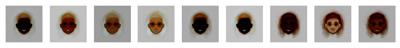

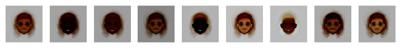

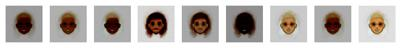

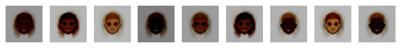

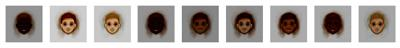

...

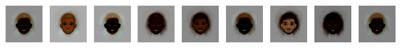

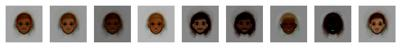

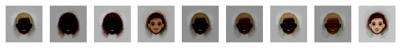

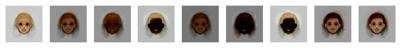

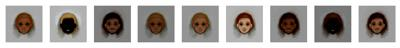

[Epoch 0/5][Batch 600/6251][D loss: 0.9761] [G loss: 0.0017]


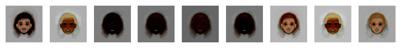

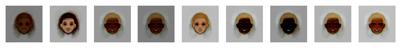

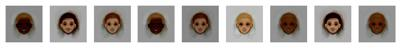

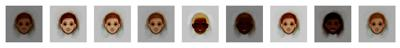

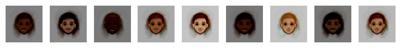

...

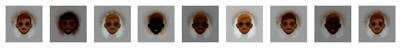

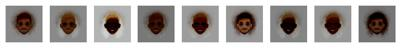

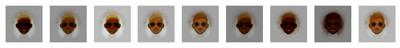

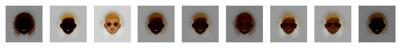

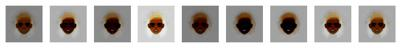

[Epoch 0/5][Batch 650/6251][D loss: 0.5725] [G loss: 0.0017]


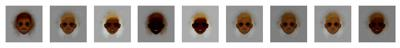

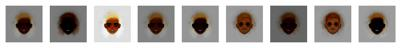

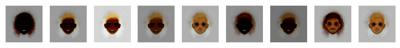

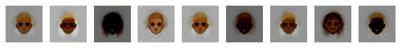

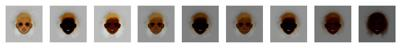

...

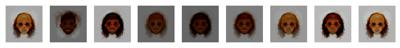

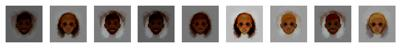

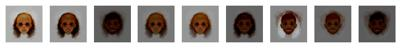

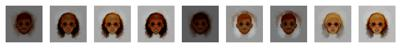

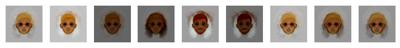

[Epoch 0/5][Batch 700/6251][D loss: 0.5136] [G loss: 0.0017]


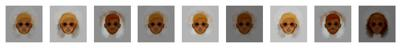

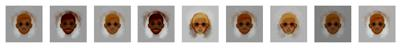

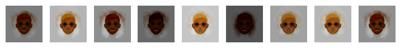

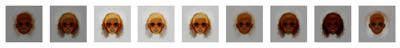

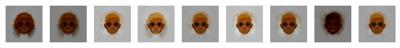

...

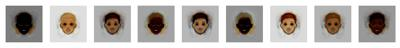

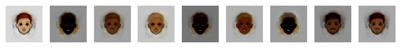

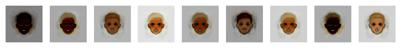

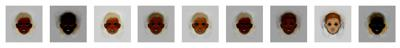

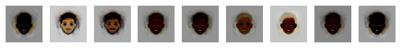

[Epoch 0/5][Batch 750/6251][D loss: 0.5314] [G loss: 0.0017]


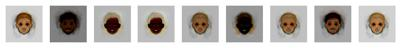

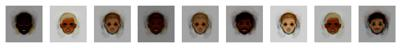

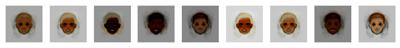

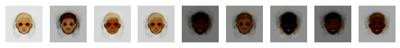

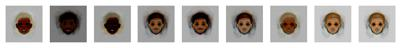

...

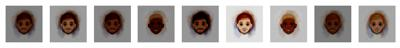

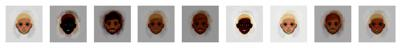

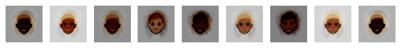

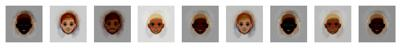

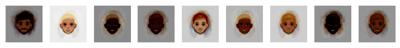

[Epoch 0/5][Batch 800/6251][D loss: 1.1110] [G loss: 0.0017]


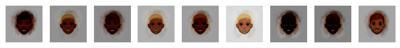

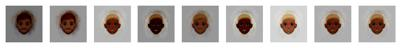

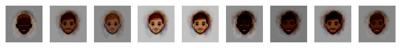

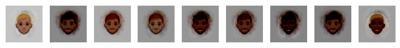

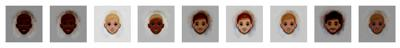

...

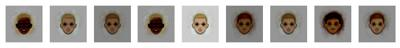

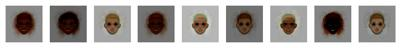

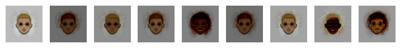

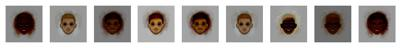

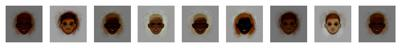

[Epoch 0/5][Batch 850/6251][D loss: 0.4634] [G loss: 0.0017]


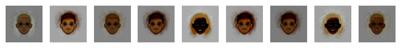

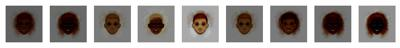

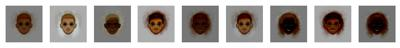

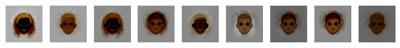

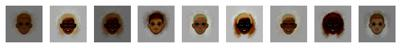

...

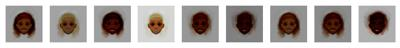

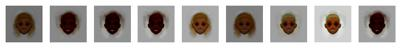

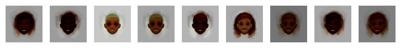

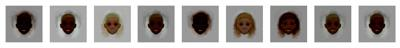

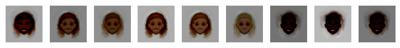

[Epoch 0/5][Batch 900/6251][D loss: 0.3600] [G loss: 0.0017]


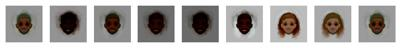

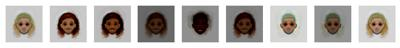

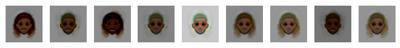

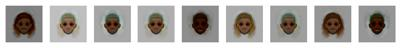

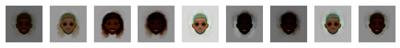

...

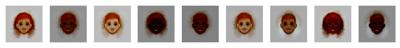

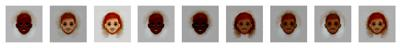

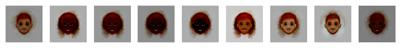

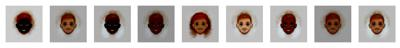

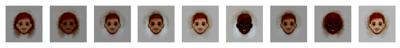

[Epoch 0/5][Batch 950/6251][D loss: 0.4914] [G loss: 0.0017]


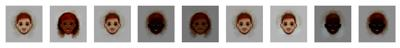

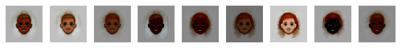

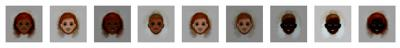

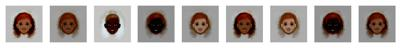

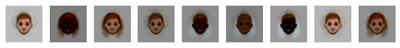

...

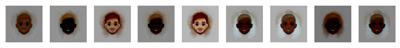

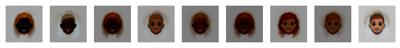

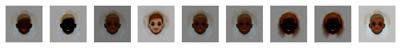

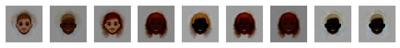

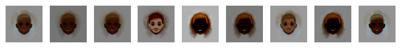

[Epoch 0/5][Batch 1000/6251][D loss: 0.4598] [G loss: 0.0017]


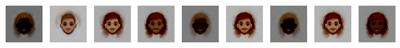

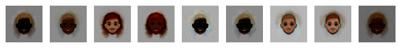

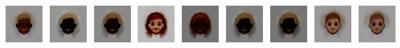

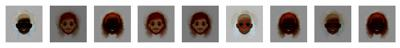

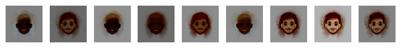

...

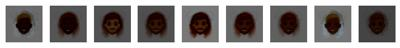

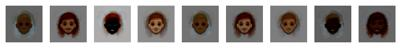

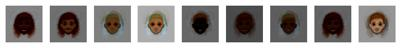

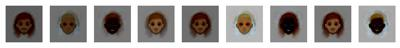

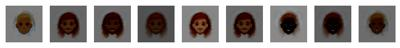

[Epoch 0/5][Batch 1050/6251][D loss: 0.4637] [G loss: 0.0017]


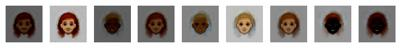

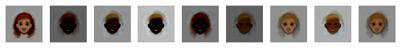

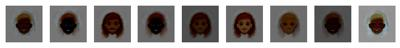

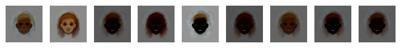

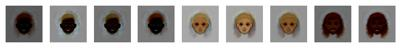

...

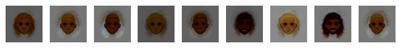

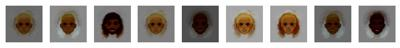

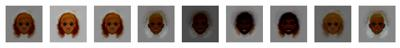

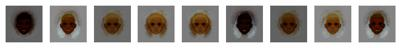

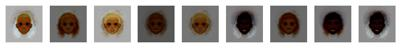

[Epoch 0/5][Batch 1100/6251][D loss: 0.4764] [G loss: 0.0017]


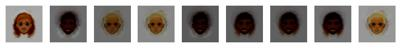

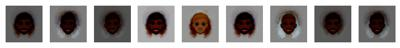

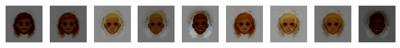

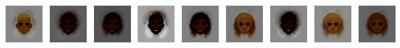

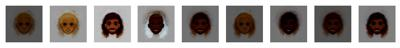

...

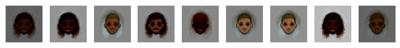

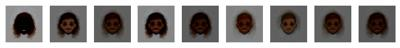

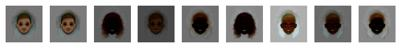

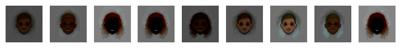

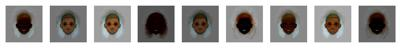

[Epoch 0/5][Batch 1150/6251][D loss: 0.3004] [G loss: 0.0017]


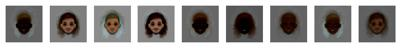

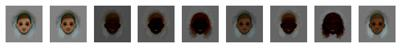

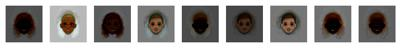

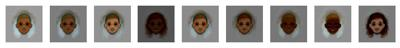

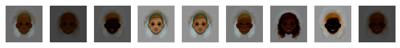

...

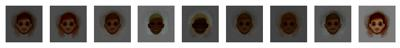

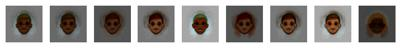

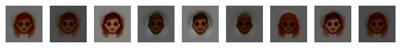

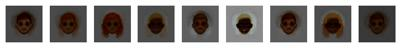

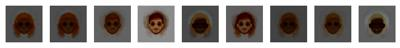

[Epoch 0/5][Batch 1200/6251][D loss: 0.3747] [G loss: 0.0017]


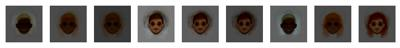

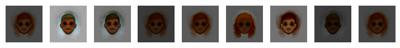

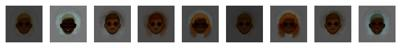

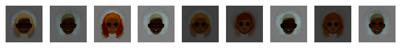

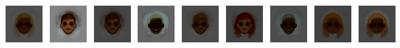

...

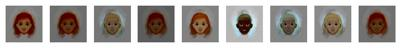

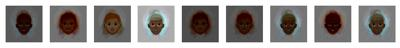

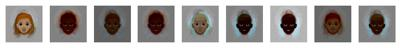

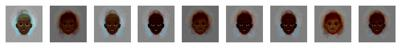

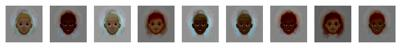

[Epoch 0/5][Batch 1250/6251][D loss: 0.4684] [G loss: 0.0017]


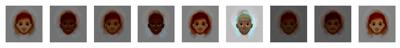

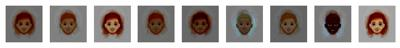

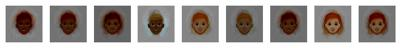

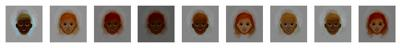

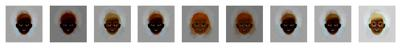

...

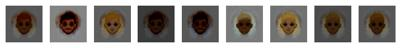

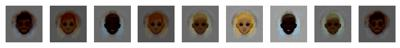

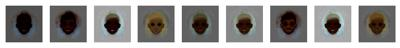

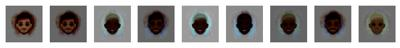

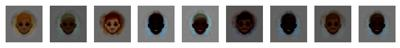

[Epoch 0/5][Batch 1300/6251][D loss: 0.4372] [G loss: 0.0017]


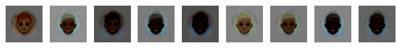

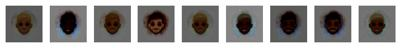

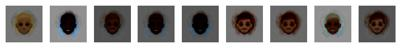

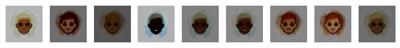

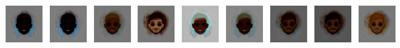

...

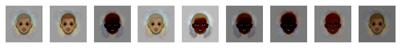

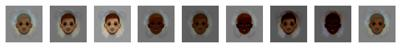

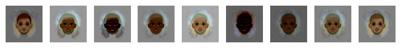

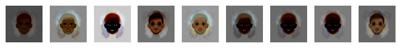

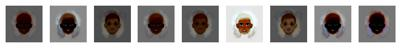

[Epoch 0/5][Batch 1350/6251][D loss: 0.7077] [G loss: 0.0017]


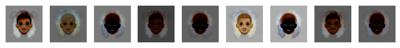

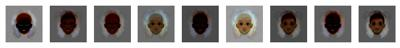

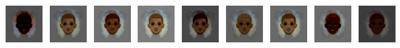

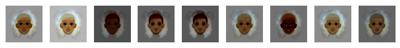

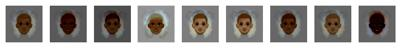

...

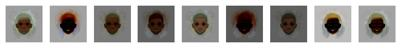

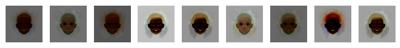

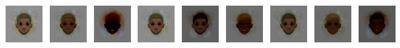

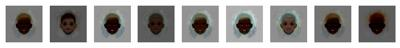

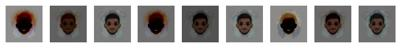

[Epoch 0/5][Batch 1400/6251][D loss: 0.5781] [G loss: 0.0017]


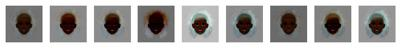

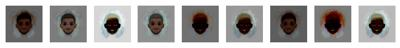

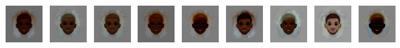

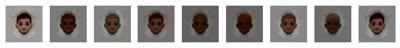

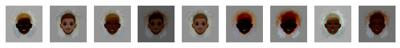

...

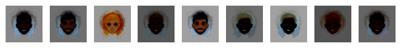

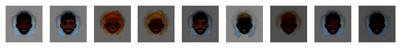

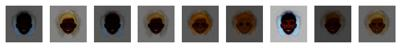

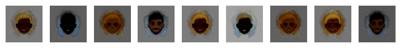

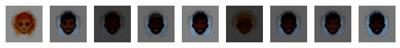

[Epoch 0/5][Batch 1450/6251][D loss: 0.4822] [G loss: 0.0017]


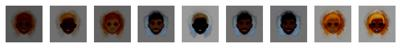

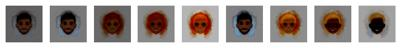

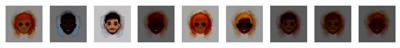

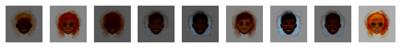

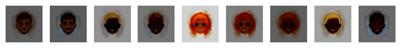

...

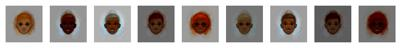

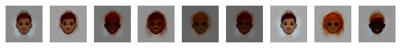

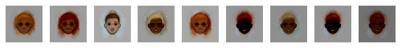

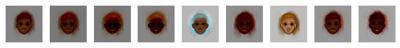

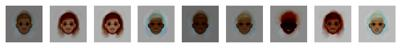

[Epoch 0/5][Batch 1500/6251][D loss: 0.6891] [G loss: 0.0017]


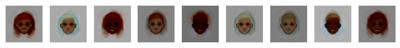

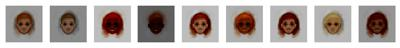

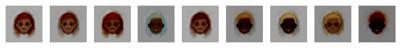

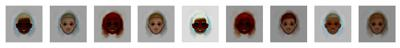

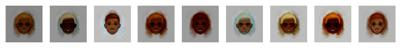

...

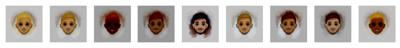

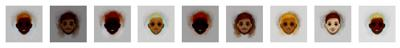

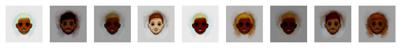

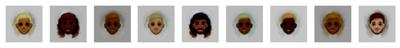

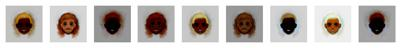

[Epoch 0/5][Batch 1550/6251][D loss: 0.7758] [G loss: 0.0017]


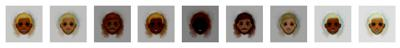

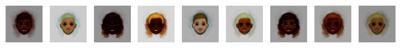

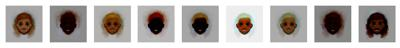

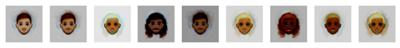

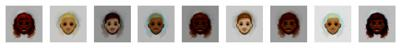

...

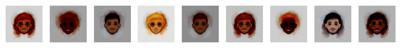

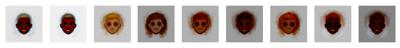

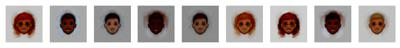

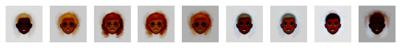

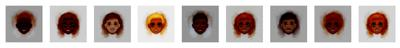

[Epoch 0/5][Batch 1600/6251][D loss: 0.5883] [G loss: 0.0017]


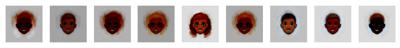

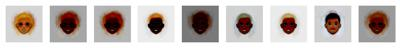

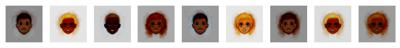

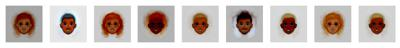

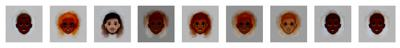

...

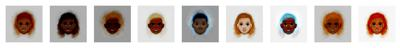

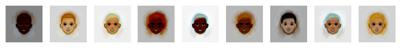

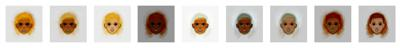

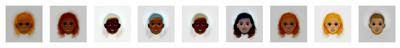

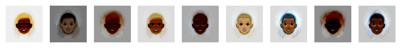

[Epoch 0/5][Batch 1650/6251][D loss: 0.5272] [G loss: 0.0017]


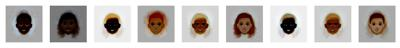

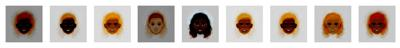

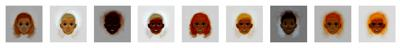

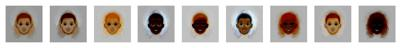

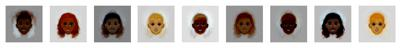

...

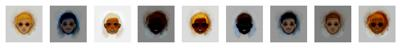

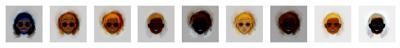

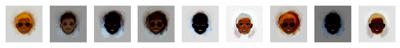

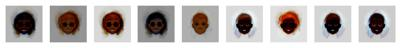

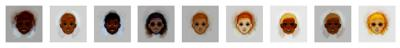

[Epoch 0/5][Batch 1700/6251][D loss: 0.5774] [G loss: 0.0017]


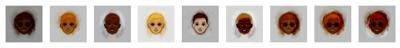

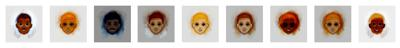

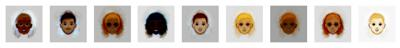

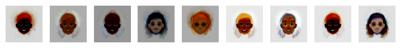

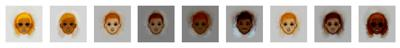

...

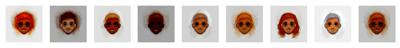

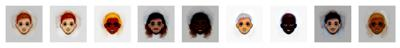

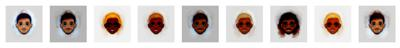

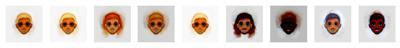

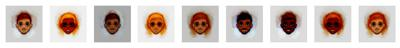

[Epoch 0/5][Batch 1750/6251][D loss: 0.6306] [G loss: 0.0017]


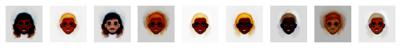

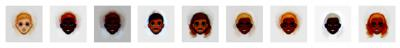

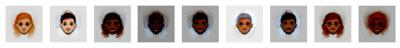

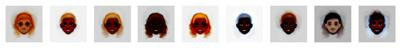

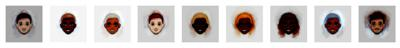

...

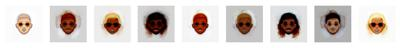

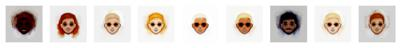

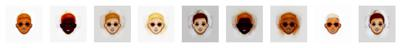

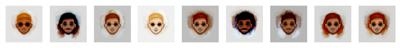

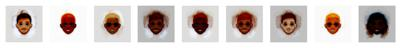

[Epoch 0/5][Batch 1800/6251][D loss: 0.8321] [G loss: 0.0017]


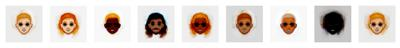

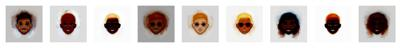

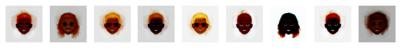

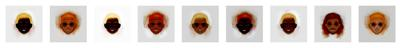

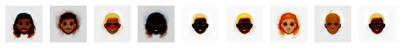

...

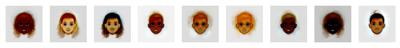

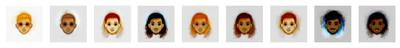

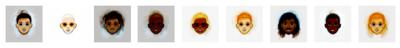

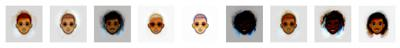

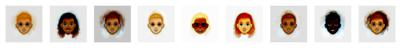

[Epoch 0/5][Batch 1850/6251][D loss: 0.6093] [G loss: 0.0017]


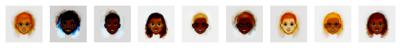

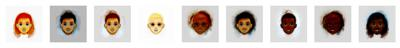

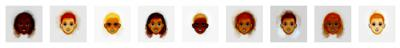

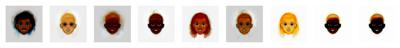

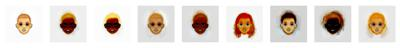

...

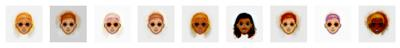

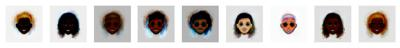

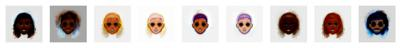

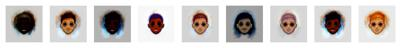

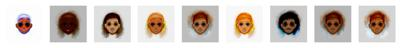

[Epoch 0/5][Batch 1900/6251][D loss: 0.6051] [G loss: 0.0017]


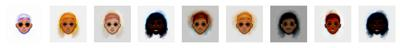

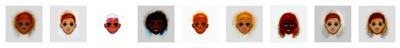

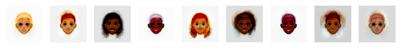

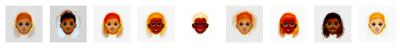

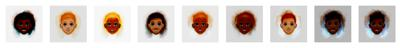

...

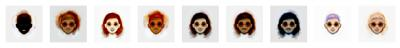

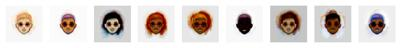

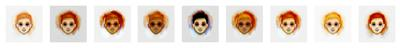

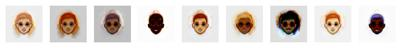

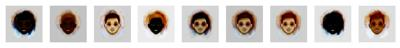

[Epoch 0/5][Batch 1950/6251][D loss: 0.7863] [G loss: 0.0017]


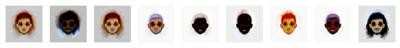

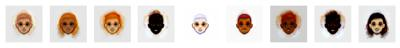

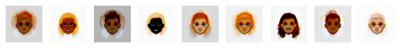

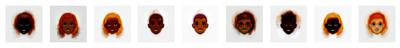

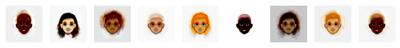

...

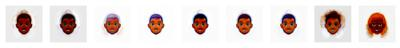

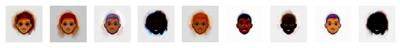

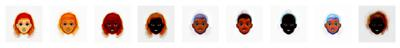

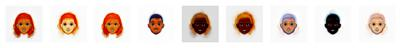

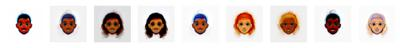

[Epoch 0/5][Batch 2000/6251][D loss: 0.6332] [G loss: 0.0017]


IsADirectoryError: [Errno 21] Is a directory: 'cartoonset100k_jpg/cartoonset100k_jpg/7'

In [33]:
train(generator,discriminator,dataloader)

In [38]:
torch.save(generator.state_dict(),"bestmodel2.pth")
torch.save(discriminator.state_dict(),"discriminator.pth")

In [35]:
print("Hello")

Hello


In [36]:
draw_images(2)

In [39]:
from google.colab import files
files.download('bestmodel2.pth')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
files.download('discriminator.pth')


In [54]:
import matplotlib.pyplot as plt
import warnings
import logging
warnings.filterwarnings("ignore", category=UserWarning, module="matplotlib.image")
logging.getLogger('matplotlib.image').setLevel(logging.ERROR)

def generate_image(n_images=1):
  with torch.no_grad():
    images=generator(torch.randn(n_images,100).to(device))
    images=torch.clamp(images,0,1)
    images=images.detach().cpu()

    plt.imshow(images[0].numpy().transpose(1,2,0))
    plt.axis('off')
  plt.show()
generate_image()